In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
%matplotlib inline

In [2]:
df = pd.read_csv("Marketing Campaign Performance - data.csv")
df

,country,channel,impressions,clicks,cost,installs,visits,purchases,revenue
0,A,APP-Acquisition-Android,14472269,74022,"13,583","12,094",NaN,15226,1839.97
1,A,APP-Acquisition-Android,3057156,27797,"4,967","5,403",NaN,4370,763.91
2,A,APP-Acquisition-iOS,537135,8066,"4,019","2,394",NaN,1929,749.46
3,A,APP-Acquisition-iOS,518521,7326,"3,243","2,100",NaN,1194,452.83
4,A,Web-Retargeting,1851036,8101,1065.45,NaN,7056.0,927,782.33
...,...,...,...,...,...,...,...,...,...
1471,T,SEM-Hotels,1103,18,3.06,NaN,20.0,12,11.27
1472,T,SEM-Hotels,2925,48,2.92,NaN,44.0,1,0.30
1473,T,SEM-Hotels,939,28,2.72,NaN,31.0,4,2.37
1474,T,SEM-Hotels,402,12,1,NaN,12.0,0,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1476 entries, 0 to 1475
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   country      1476 non-null   object 
 1   channel      1476 non-null   object 
 2   impressions  1476 non-null   int64  
 3   clicks       1476 non-null   int64  
 4   cost         1476 non-null   object 
 5   installs     38 non-null     object 
 6   visits       1428 non-null   float64
 7   purchases    1476 non-null   int64  
 8   revenue      1217 non-null   float64
dtypes: float64(2), int64(3), object(4)
memory usage: 103.9+ KB


In [4]:
#missing values 

df.isna().sum()

country           0
channel           0
impressions       0
clicks            0
cost              0
installs       1438
visits           48
purchases         0
revenue         259
dtype: int64

In [5]:
features_with_na = [features for features in df.columns if df[features].isnull().sum() > 1] #list comprehension to identify null values in Data frame

for feature in features_with_na:
    print(feature, np.round(df[feature].isnull().mean() * 100, 4),  ' % missing values')

installs 97.4255  % missing values
visits 3.252  % missing values
revenue 17.5474  % missing values


# As Data is Realtime and no ML model is to be built, so we're avoiding preproprocessing of the data

In [6]:
df.fillna(0) # We won't be deleteing any data, replacing all NA values with 0 

,country,channel,impressions,clicks,cost,installs,visits,purchases,revenue
0,A,APP-Acquisition-Android,14472269,74022,"13,583","12,094",0.0,15226,1839.97
1,A,APP-Acquisition-Android,3057156,27797,"4,967","5,403",0.0,4370,763.91
2,A,APP-Acquisition-iOS,537135,8066,"4,019","2,394",0.0,1929,749.46
3,A,APP-Acquisition-iOS,518521,7326,"3,243","2,100",0.0,1194,452.83
4,A,Web-Retargeting,1851036,8101,1065.45,0,7056.0,927,782.33
...,...,...,...,...,...,...,...,...,...
1471,T,SEM-Hotels,1103,18,3.06,0,20.0,12,11.27
1472,T,SEM-Hotels,2925,48,2.92,0,44.0,1,0.30
1473,T,SEM-Hotels,939,28,2.72,0,31.0,4,2.37
1474,T,SEM-Hotels,402,12,1,0,12.0,0,0.00


# . All The Numerical Variables **

In [7]:
numerical_features = [feature for feature in df.columns if df[feature].dtypes != 'O'] # list comprehension feature that are not equal to object type

print('Number of numerical variables: ', len(numerical_features))

# visualise the numerical variables
df[numerical_features].head()


Number of numerical variables:  5


,impressions,clicks,visits,purchases,revenue
0,14472269,74022,NaN,15226,1839.97
1,3057156,27797,NaN,4370,763.91
2,537135,8066,NaN,1929,749.46
3,518521,7326,NaN,1194,452.83
4,1851036,8101,7056.0,927,782.33


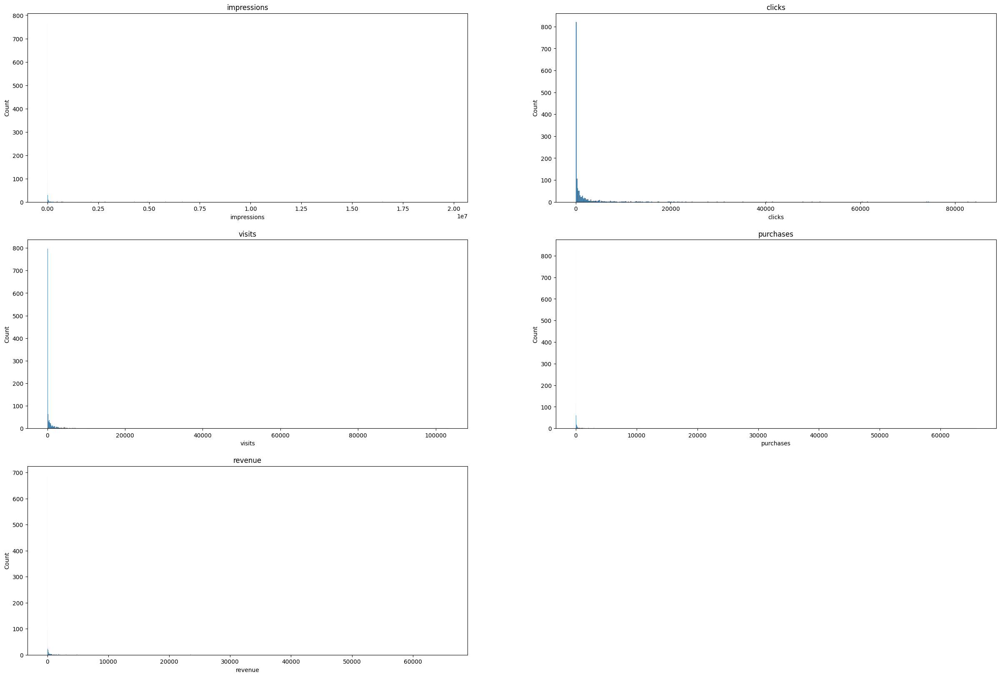

In [8]:
# Distribution of the Data, to check skewness of the data

a = 3  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(30,20))

for i in numerical_features:
    plt.subplot(a, b, c)
    plt.title('{}'.format(i))

    sns.histplot(data= df, x= i)

    c = c + 1

plt.show()

In [9]:
## Numerical variables are usually of 2 type
## 1. Continous variable and Discrete Variables

discrete_feature=[feature for feature in numerical_features if len(df[feature].unique())]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 5


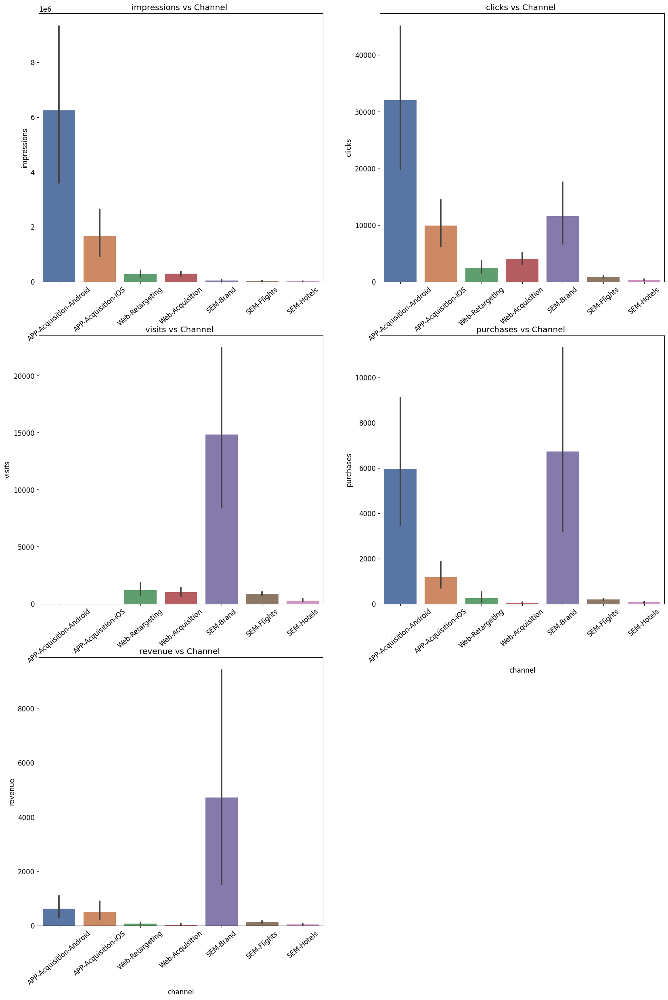

In [10]:
a = 5  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(20, 50))
font = {'size': 12}
  
# using rc function
plt.rc('font', **font)

for i in numerical_features:
    plt.subplot(a, b, c)
    plt.title('{} vs Channel '.format(i))
    sns.barplot(x= "channel", y=  i, data= df, palette="deep")
    plt.xticks(rotation = 40)
    c = c + 1

plt.show()

## BOXPLOT SHOWS OUTLIERS INCLUDED IN THE DATASET

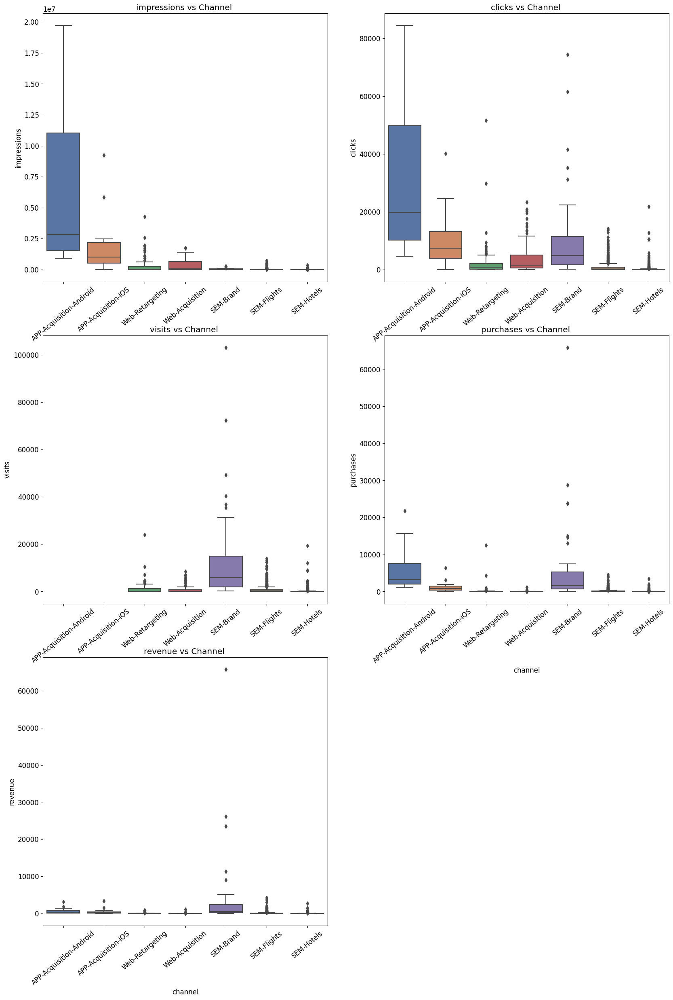

In [11]:
a = 5  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(20, 50))
font = {'size': 12}
  
# using rc function
plt.rc('font', **font)

for i in numerical_features:
    plt.subplot(a, b, c)
    plt.title('{} vs Channel '.format(i))
    sns.boxplot(x= "channel", y=  i, data= df, palette="deep")
    plt.xticks(rotation = 40)
    c = c + 1

plt.show()

In [12]:
categorical_features=[feature for feature in df.columns if df[feature].dtypes=='O']
categorical_features

['country', 'channel', 'cost', 'installs']

In [13]:
for feature in categorical_features:
    print('The feature is {} and number of categories are {}'.format(feature,len(df[feature].unique())))

The feature is country and number of categories are 10
The feature is channel and number of categories are 7
The feature is cost and number of categories are 1172
The feature is installs and number of categories are 39


# **2.1 Which channel’s ads do the users like the most? (hint: click through rate or CTR)**


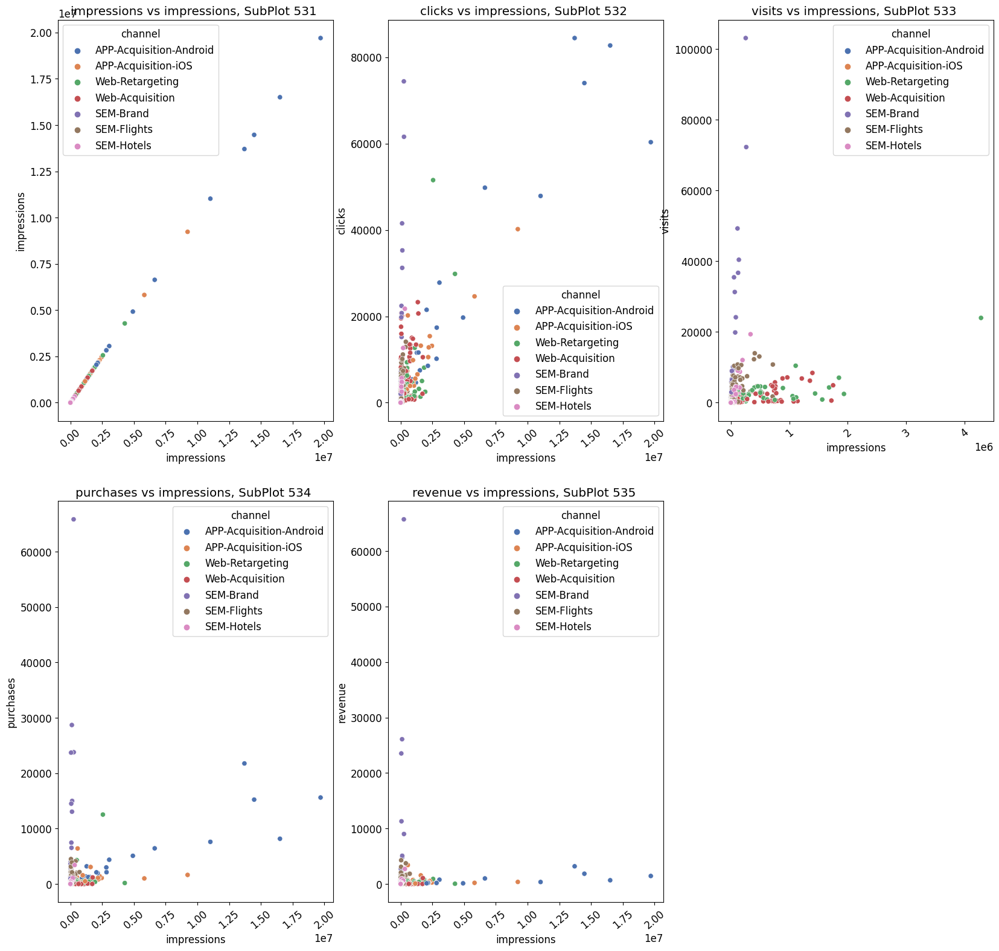

In [14]:
a = 5  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(20, 50))
font = {'size': 12}
  
# using rc function
plt.rc('font', **font)

for i in numerical_features:
    plt.subplot(a, b, c)
    plt.title('{} vs impressions, SubPlot {}{}{} '.format(i,a, b,c))
    sns.scatterplot(x= "impressions", y=  i, data= df, palette="deep", hue = "channel")
    plt.xticks(rotation = 40)
    c = c + 1

plt.show()

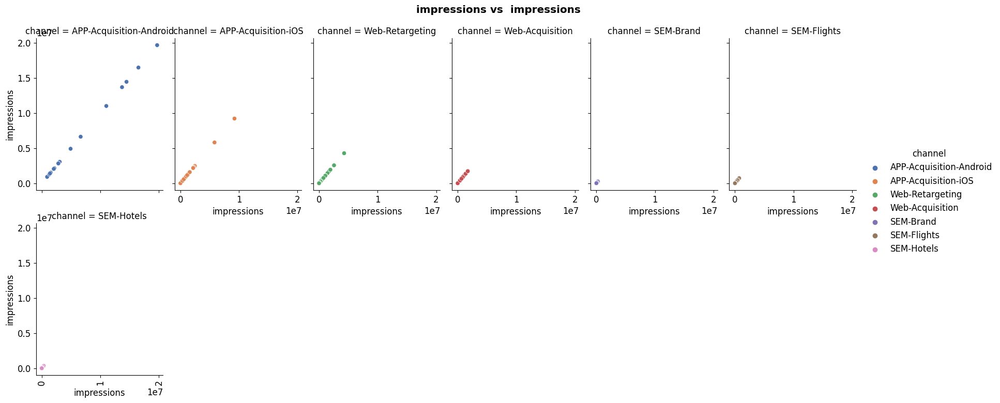

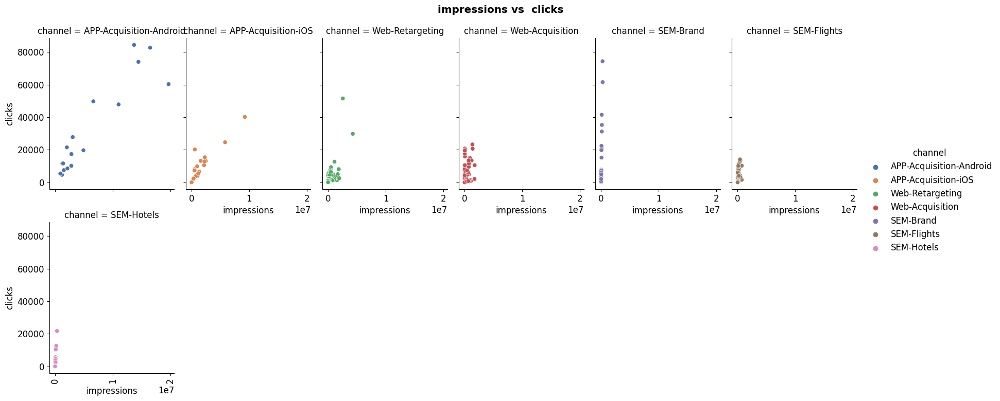

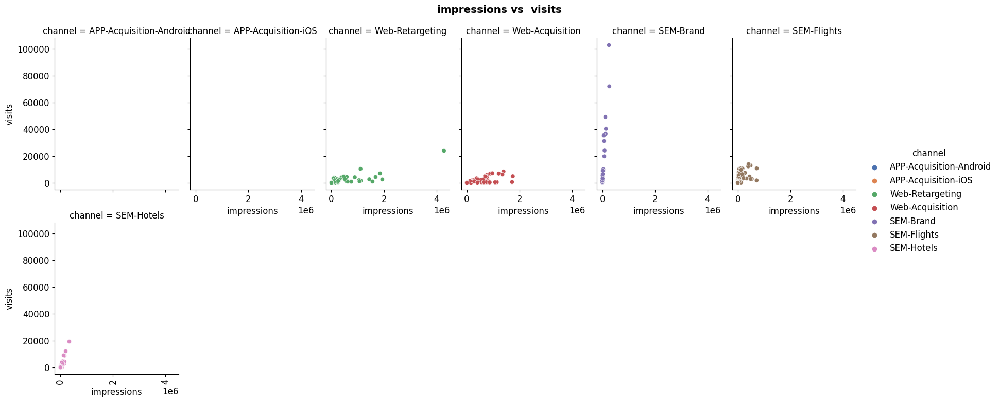

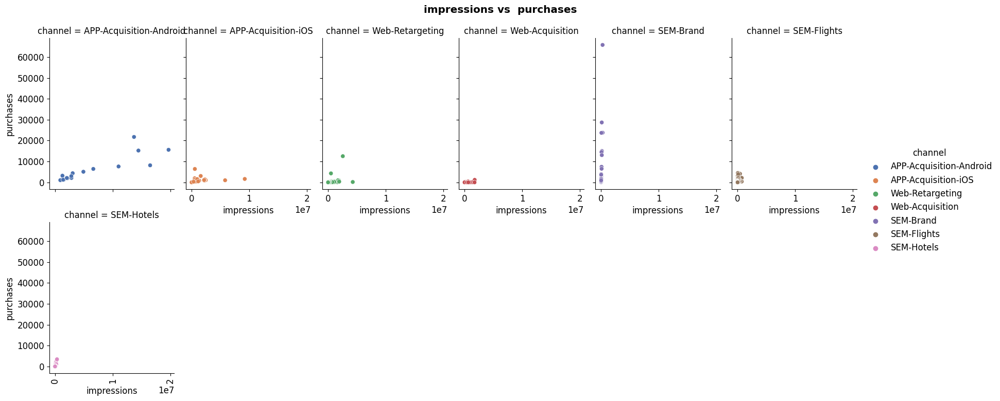

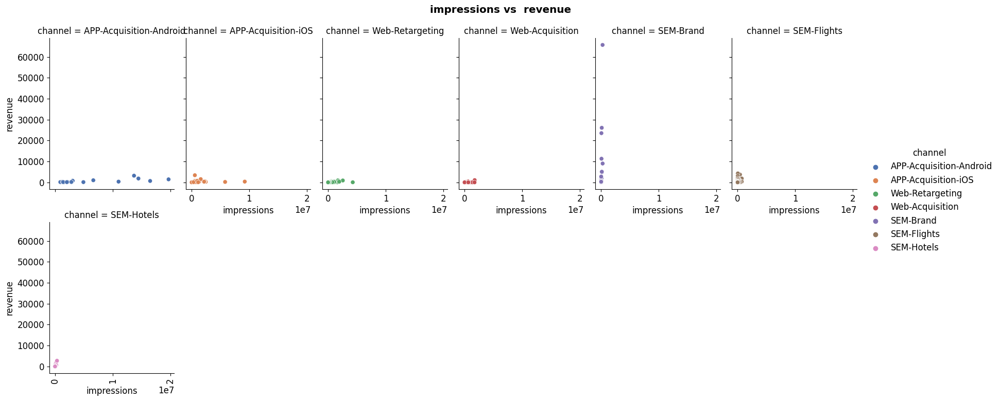

In [15]:
for i in numerical_features:
    g = sns.relplot(data=df, x= "impressions", y=i, col= "channel", col_wrap=6, hue= "channel", height= 4, aspect=.7,kind="scatter", legend= True, palette="deep")
    g.fig.suptitle(f" impressions vs  {i} ", fontweight ="bold")
    plt.subplots_adjust(top=.90)
    plt.xticks(rotation = 90)
plt.show()

## focusing on clicks vs impressions graph, APP - Acqusition Android, APP - Acqusition IOS and Web retargetting are most liked by the users. As they have high click / impressions. 

 ## **2.2 What’s the CPI of App channels (APP-Acquisition-Android and APP-Acquisition-iOS) by country and OS?**


In [16]:

df["cost"] = pd.to_numeric(df.cost, errors='coerce') #converting cost to numeric data

## CPI=  Cost per install


## CPI by OS

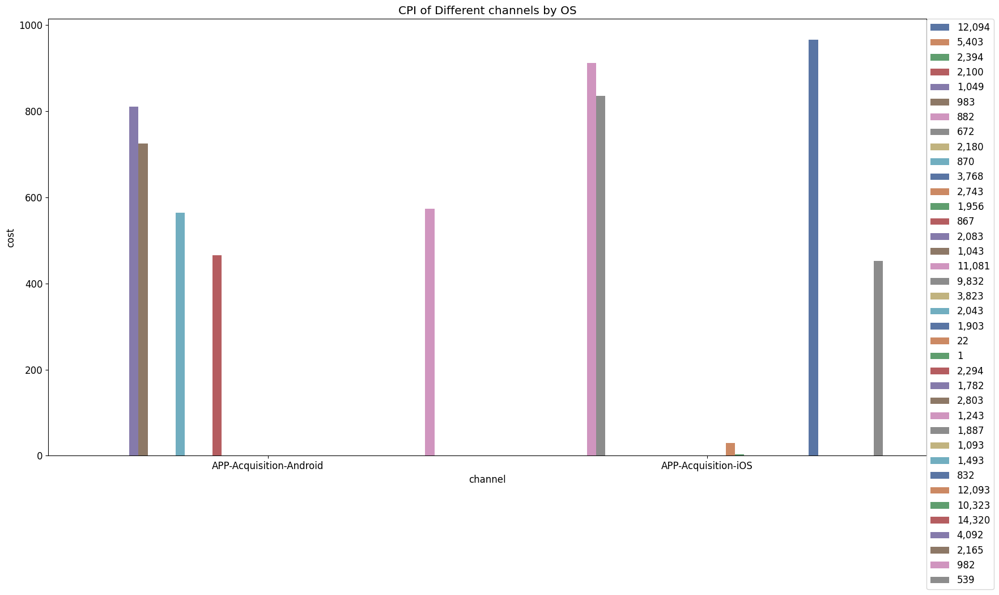

In [17]:
plt.figure(figsize=(20,10))
sns.barplot(data = df, x = "channel", y =  "cost", hue = "installs", palette="deep",   order=["APP-Acquisition-Android", "APP-Acquisition-iOS"])
plt.title("CPI of Different channels by OS")
plt.legend(bbox_to_anchor=(1, 1), loc='best', borderaxespad=0.)
plt.show()

## CPI on basis of different country

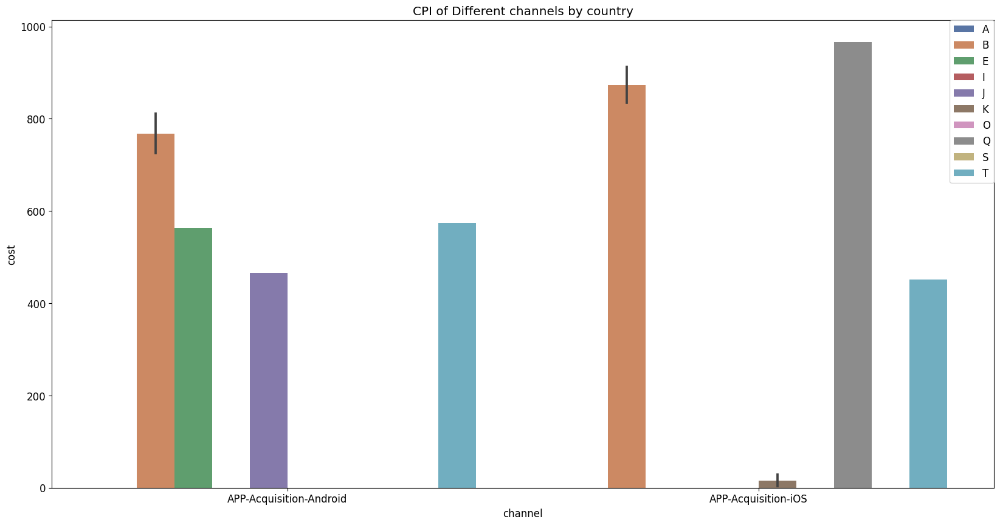

In [18]:
plt.figure(figsize=(20,10))
sns.barplot(data = df, x = "channel", y =  "cost", hue = "country", palette="deep",   order=["APP-Acquisition-Android", "APP-Acquisition-iOS"])
plt.title("CPI of Different channels by country")
plt.legend(bbox_to_anchor=(1, 1), loc='best', borderaxespad=0.)
plt.show()

# **2.3 In SEM channels, which country has the best conversion rate?**

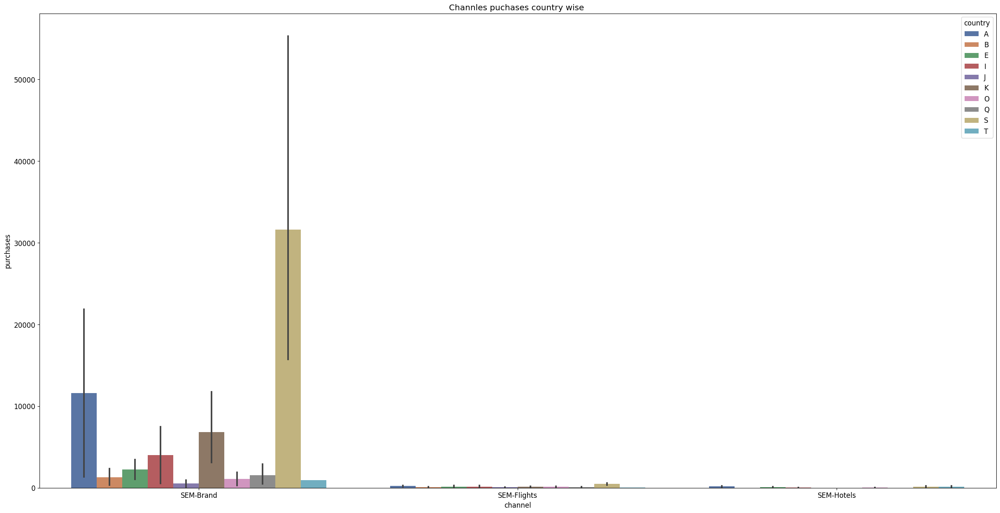

In [23]:
plt.figure(figsize = (30,15))
plt.title('Channles puchases country wise ')
sns.barplot(x= "channel"  , y=  'purchases', data= df, palette="deep", hue = "country" , order=["SEM-Brand", "SEM-Flights", "SEM-Hotels"])
plt.xticks(rotation = 0)
plt.show()

## from above graph we can conclude that country S has high conversion Rate as it has maxiumum purchases 

 # **2.4 Which Web channel has better CPA?**

### (Cost Per Action or Acquisition) , (CPA) is calculated by dividing the total cost of conversions by the total number of conversions

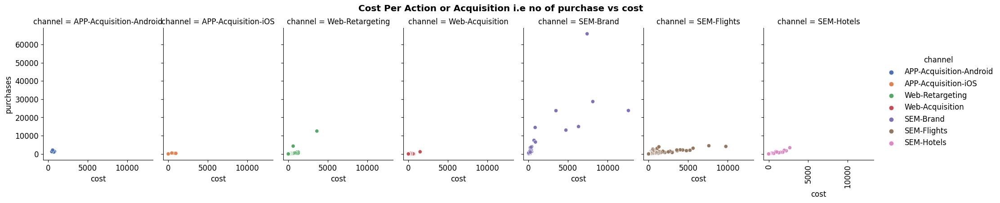

In [20]:
g = sns.relplot(data=df, x= "cost", y= 'purchases', col= "channel", col_wrap=7, hue= "channel", height= 4, aspect=.7,kind="scatter", legend= True, palette="deep")
g.fig.suptitle(f" Cost Per Action or Acquisition i.e no of purchase vs cost ", fontweight ="bold")
plt.subplots_adjust(top=.85)
plt.xticks(rotation = 90)
plt.show()

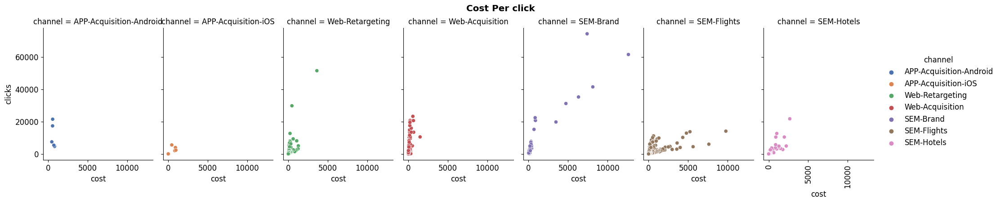

In [21]:
g = sns.relplot(data=df, x= "cost", y= 'clicks', col= "channel", col_wrap=7, hue= "channel", height= 4, aspect=.7,kind="scatter", legend= True, palette="deep")
g.fig.suptitle(f" Cost Per click ", fontweight ="bold")
plt.subplots_adjust(top=.85)
plt.xticks(rotation = 90)
plt.show()

## CPA of channel SEM brand is better than other channles as, cost of acqusition is less and purchases by customer is moree.

# **2.5 Identify the top 3 performing channels of each country in terms of ROI.**


### The basic ROI calculation is: ROI = (Net Profit/Total Cost)*100.

In [25]:
len(df.columns)

9

In [26]:
ROI = (df.revenue / df.cost) * 100
data = pd.DataFrame(ROI, columns = ["ROI"])
# Using DataFrame.insert() to add a column
df.insert(10, "ROI", data, True)

IndexError: index 10 is out of bounds for axis 0 with size 9

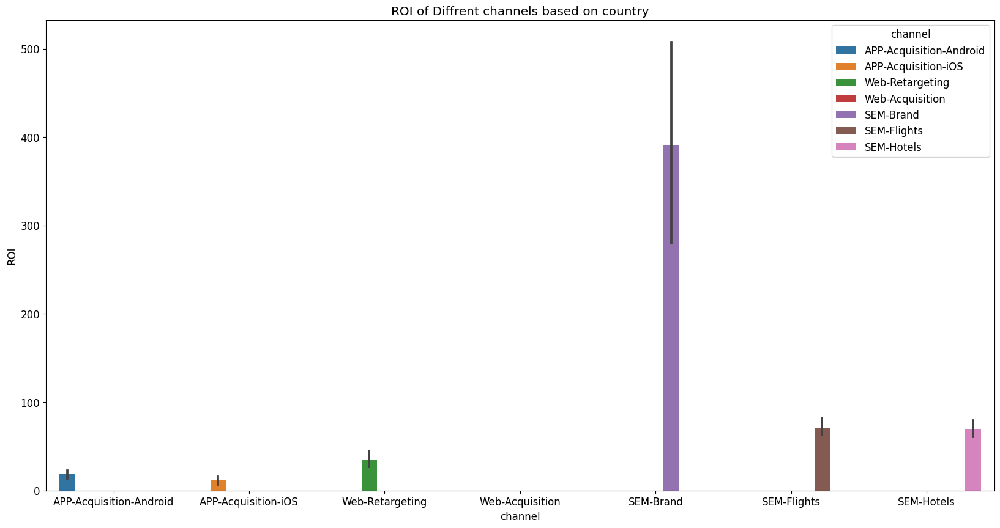

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(data = df, x = "channel", y = "ROI",  hue = "channel")
plt.title("ROI of Diffrent channels based on country")
plt.show()

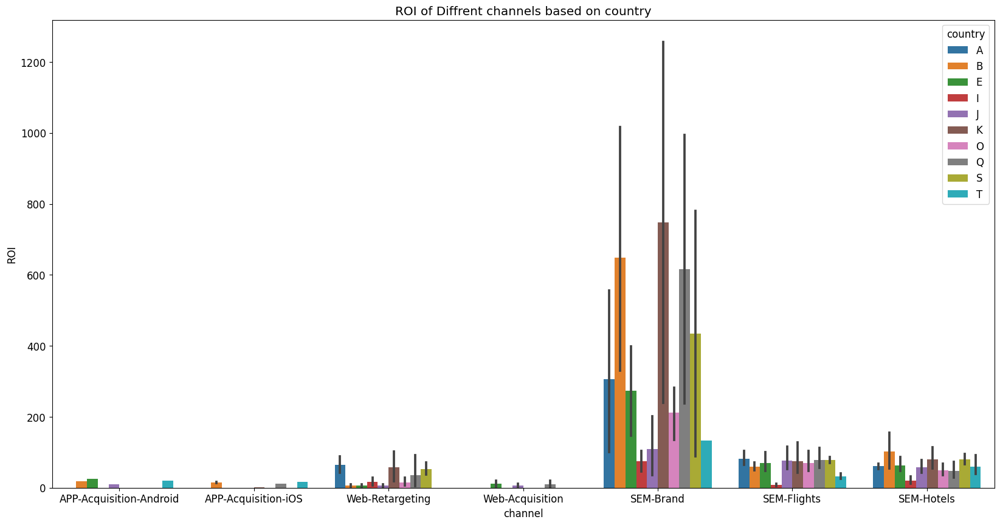

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(data = df, x = "channel", y = "ROI",  hue = "country")
plt.title("ROI of Diffrent channels based on country")
plt.show()


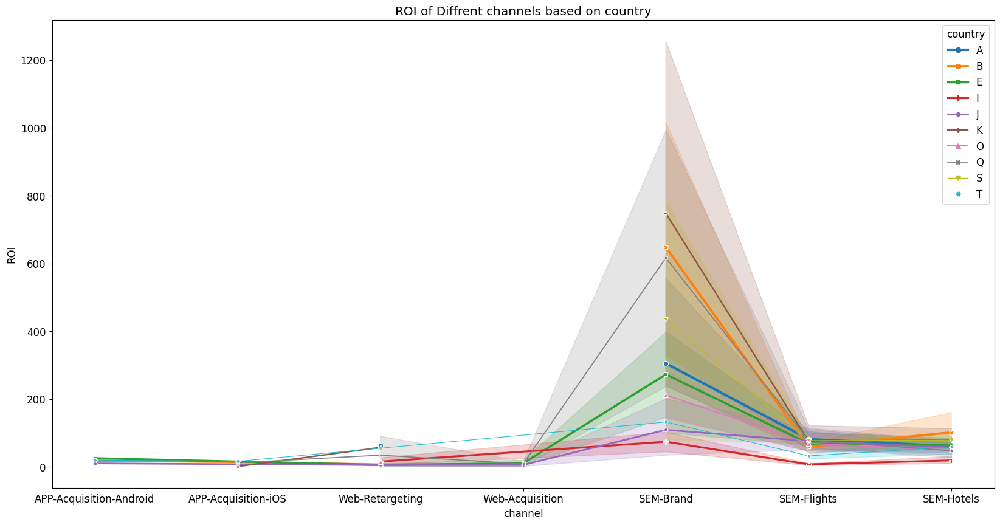

In [ ]:
plt.figure(figsize=(20,10))
sns.lineplot(data = df, x = "channel", y = "ROI",size = "country" , hue = "country", style = "country", markers=True, dashes=False)
plt.title("ROI of Diffrent channels based on country")
plt.show()


### Based on above graph, we can see ROI of all countries are majorly contributed by
### 1. SEM Brand
### 2. SEM fligts
### 3. SEM Hotels
### 4. Web Retargeting

## **Additional graphs to understand distribution of ROI vs revenue & cost**

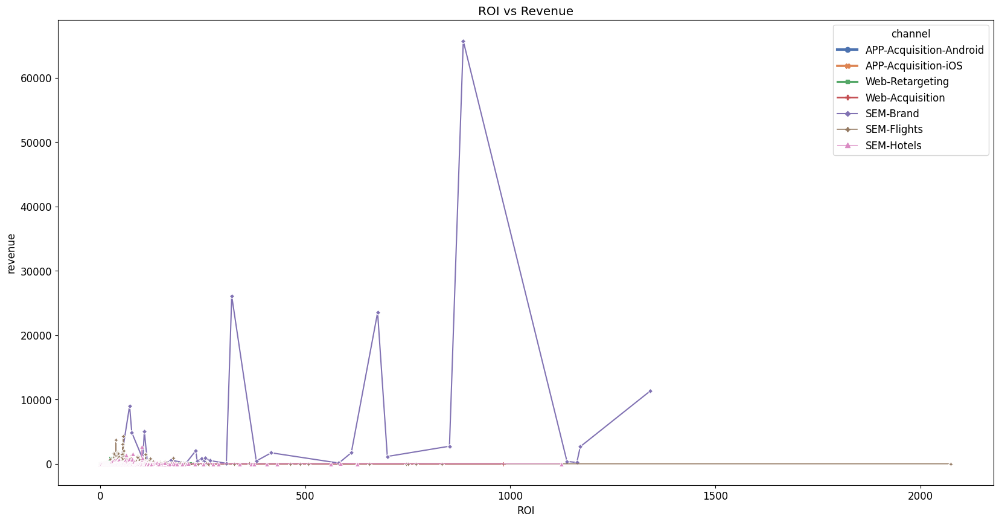

In [ ]:
plt.figure(figsize=(20,10))
sns.lineplot(data = df, x = "ROI", y = "revenue", size = "channel", hue = "channel", palette= "deep", style = "channel", markers=True, dashes=False )
plt.title("ROI vs Revenue")
plt.show()


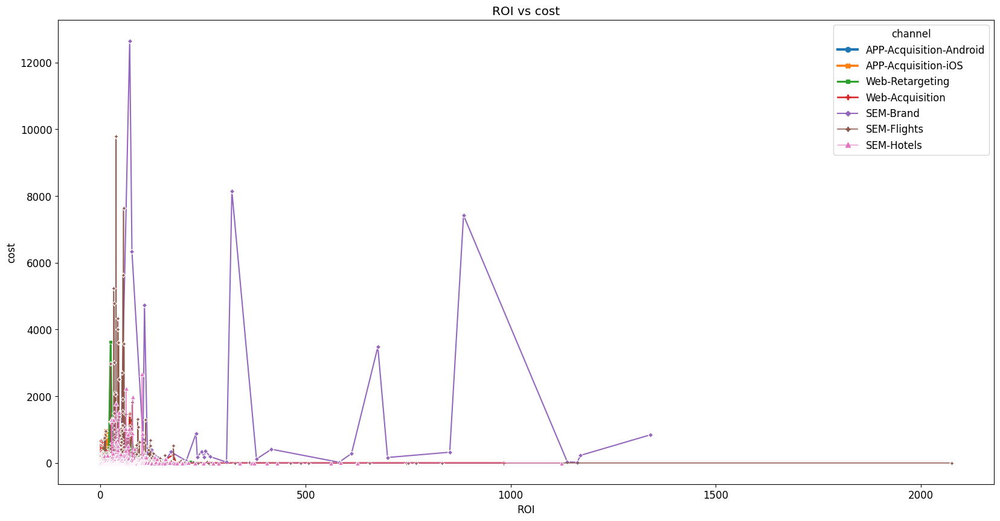

In [ ]:
plt.figure(figsize=(20,10))
sns.lineplot(data = df, x = "ROI", y = "cost",size =  "channel", hue = "channel", style = "channel", markers=True, dashes=False)
plt.title("ROI vs cost")
plt.show()


# **3. What would you recommend our Digital Marketing team to do when they run online campaigns?**


### 1. I would Recommend DM team to focus more on channels APP - Acqusition Android, APP - Acqusition IOS and Web retargetting, as they have higher clicks and purchases!, but with equivalent high cost of acqusition.

### 2. focusing of SEM brand,SEM flights and SEM hotel is also important as they have high contribution is ROI. 
### 3. CPC is less for web Acqusition
### 4. CPI is more of IOS OS.
